## Imports

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from coppeliasim_zmqremoteapi_client import *

WORLDX, WORLDY = 24, 24 

## Remote API Functions

In [22]:
# create a client to connect to zmqRemoteApi server:
# (creation arguments can specify different host/port,
# defaults are host='localhost', port=23000)
client = RemoteAPIClient()

# get a remote object:
sim = client.require('sim')

# call API function fo test:
pioneer = sim.getObject('/Pioneer_p3dx')
print("Printando o pioninho: " + str(pioneer))

Printando o pioninho: 13


## Gradiente

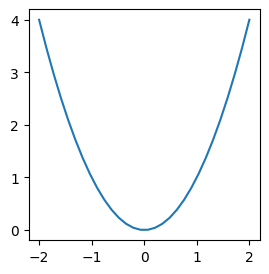

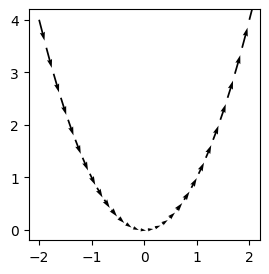

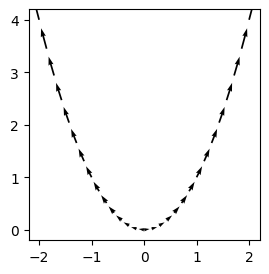

In [23]:
# Atenção com a ordem dos pontos
xn = np.linspace(0, -2, 15)
xp = np.linspace(0, 2, 15)
x =  np.linspace(-2, 2, 30)
y = x**2


fig = plt.figure(figsize=(6,3), dpi=100)
ax = fig.add_subplot(111, aspect='equal')
plt.plot(x, y)


dx = np.gradient(x)
dy = np.gradient(y)

fig = plt.figure(figsize=(6,3), dpi=100)
ax = fig.add_subplot(111, aspect='equal')
ax.quiver(x, y, dx, dy)


fig = plt.figure(figsize=(6,3), dpi=100)
ax = fig.add_subplot(111, aspect='equal')

y = xn**2
dx = np.gradient(xn)
dy = np.gradient(y)
ax.quiver(xn, y, dx, dy)

y = xp**2
dx = np.gradient(xp)
dy = np.gradient(y)
ax.quiver(xp, y, dx, dy)

In [24]:
def readSensorData(range_data_signal_id="hokuyo_range_data", 
                    angle_data_signal_id="hokuyo_angle_data"):
    # the first call should be non-blocking to avoid getting out-of-sync angle data
    string_range_data = sim.getStringSignal(range_data_signal_id)

    # the second call should block to avoid out-of-sync scenarios
    # between your python script and the simulator's main loop
    # (your script may be slower than the simulator's main loop, thus
    # slowing down data processing)
    string_angle_data = sim.getStringSignal(angle_data_signal_id)

    # check if both data were obtained correctly
    if string_range_data is not None and string_angle_data is not None:
        # unpack data from range and sensor messages
        raw_range_data = sim.unpackFloatTable(string_range_data)
        raw_angle_data = sim.unpackFloatTable(string_angle_data)

        return raw_range_data, raw_angle_data

    # return None in case nothing was obtained from the simulator
    return None

# Função para desenhar os dados do laser
def draw_laser_data(laser_data, max_sensor_range=5):
    fig = plt.figure(figsize=(6,6), dpi=100)
    ax = fig.add_subplot(111, aspect='equal')

    # for ang, dist in laser_data:
    for i in range(len(laser_data)):
        ang, dist = laser_data[i]
        # Quando o feixe não acerta nada, retorna o valor máximo (definido na simulação)
        # Logo, usar um pequeno limiar do máximo para considerar a leitura
        if (max_sensor_range - dist) > 0.1:
            x = dist * np.cos(ang)
            y = dist * np.sin(ang)
            c = 'r'
            if ang < 0:    
                c = 'b'
            ax.plot(x, y, 'o', color=c)

    ax.plot(0, 0, 'k>', markersize=10)
        
    ax.grid()
    ax.set_xlim([-max_sensor_range, max_sensor_range])
    ax.set_ylim([-max_sensor_range, max_sensor_range])

In [25]:
# Utiliza as posições e orientações de de um ponto em determinado referencial global e realiza a transformação homogênia
# para o referencial da posição e orientação de posA e  oriA

def transformacao(posA, oriA):
    # Criação da matriz de transformação homogênea
    RWA = Rz(oriA[2])

    TWA = np.array([[posA[0]], [posA[1]], [posA[2]]]) # Transforma a posição em um array

    # Adiciona uma linha [0, 0, 0, 1] à direita da matriz RWA
    HWA = np.column_stack((RWA, TWA))
    HWA = np.row_stack((HWA, [0, 0, 0, 1]))  # Adiciona a linha [0, 0, 0, 1] ao final da matriz HWA

    return HWA

#### Funções auxiliares para coleta de dados da API do CoppeliaSim

In [26]:
# Função para rotacionar em torno do eixo z
def Rz(theta):
    return np.array([
        [np.cos(theta), -np.sin(theta), 0],
        [np.sin(theta), np.cos(theta), 0],
        [0, 0, 1]
    ])

def get_object_position(sim, object_name):
    return sim.getObjectPosition(sim.getObject(object_name), -1)

def get_object_orientation(sim, object_name):
    return sim.getObjectOrientation(sim.getObject(object_name), -1)

## Attraction force

Goal [1.175, 6.050000000000001, 0.0]
[[ 0.   0. ]
 [ 0.4  0. ]
 [ 0.8  0. ]
 ...
 [23.2 24. ]
 [23.6 24. ]
 [24.  24. ]]


(0.0, 24.0)

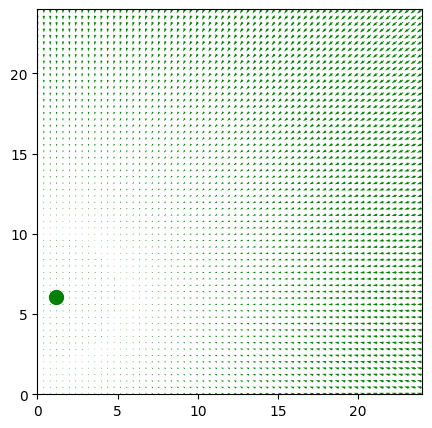

In [27]:
def att_force(q, goal, katt=.01):
    return katt*(np.array(goal) - np.array(q))

#goal = np.array([8, 2])
goal = get_object_position(sim, '/tree')
print("Goal", goal)

# reshape goal to 2 element array
goal = np.array(goal[:2])


fig = plt.figure(figsize=(8,5), dpi=100)
ax = fig.add_subplot(111, aspect='equal')

XX, YY = np.meshgrid(np.arange(0, WORLDX+.4, .4), np.arange(0, WORLDY+.4, .4))
XY = np.dstack([XX, YY]).reshape(-1, 2)
print(XY)

Fatt = att_force(XY, goal)
Fatt_x = Fatt[:,0] 
Fatt_y = Fatt[:,1]

ax.quiver(XX, YY, Fatt_x, Fatt_y, color='g')

plt.plot(goal[0], goal[1], 'og', markersize=10)
    
ax.set_xlim(0, WORLDX)
ax.set_ylim(0, WORLDY)

## Repulsion force

ori ->  [-0.0, 0.0, 1.2217304763961128]
Obstacle [ 3.2         0.075      -0.          0.          1.22173048]
len(d) ->  3721
Frep ->  [[ 0.00000000e+00  0.00000000e+00]
 [-3.01734799e-04 -8.08218209e-06]
 [-1.44111817e-03 -4.50349427e-05]
 ...
 [ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]]


(0.0, 24.0)

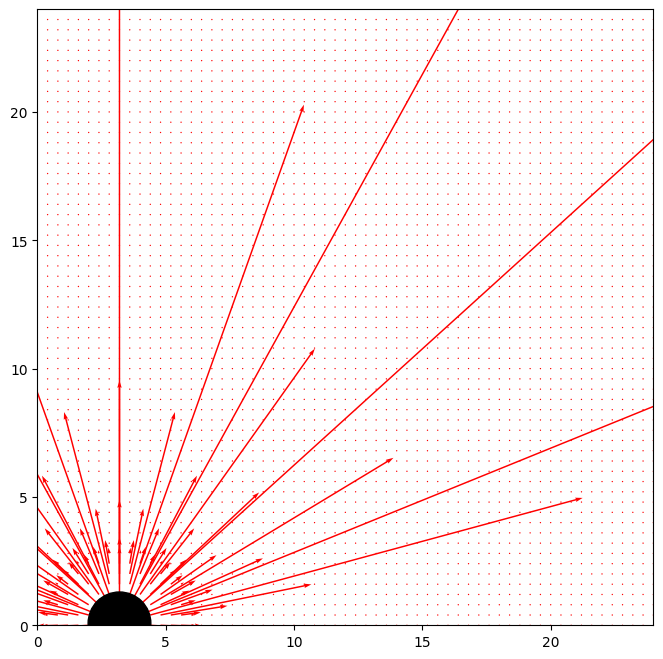

In [28]:
def rep_force(q, obs, R=3, krep=.1):
    
    # Obstáculo: (x, y, r)
    v = np.array(q) - np.array(obs[0:2])
    d = np.linalg.norm(v, axis=1) - obs[2]
    #d = np.linalg.norm(v, axis=1) 
    # se for necessário fazer reshape
    print("len(d) -> ", len(d))
    if len(d.shape) >= 1:
        d = d.reshape((len(v) ,1)) 
    
    # Adicionando uma pequena constante ao raio para evitar divisão por zero
    obs_radius = obs[2] if obs[2] > 0 else 0.001  
    rep = (1/d**2)*((1/d)-(1/R))*(v/d)    
    
    invalid = np.squeeze(d > R)
    rep[invalid, :] = 0
    
    return np.array(krep)*np.array(rep)

# Obstáculo: (x, y, r)
#obs = np.array([3, 4, .5])
obs = get_object_position(sim, '/muro')
obs = np.array(obs[:2])
obs_ori = get_object_orientation(sim, '/muro')
print("ori -> ", obs_ori)
# juntar os vetores obs e terceira_posicao
#obs = np.hstack((obs, obs_ori[2]))
obs = np.concatenate((obs, obs_ori))#[2:3] 
print("Obstacle", np.array(obs))

fig = plt.figure(figsize=(8,8), dpi=100)
ax = fig.add_subplot(111, aspect='equal')

Frep = rep_force(XY, np.array(obs))
print("Frep -> ", Frep)
Frep_x = np.copy(Frep[:,0])  # Cuidado com as referências
Frep_y = np.copy(Frep[:,1])  # Cuidado com as referências

# Threshold para visualização
fmax = .15
Fm = np.linalg.norm(Frep, axis=1)
Frep_x[Fm > fmax], Frep_y[Fm > fmax] = 0, 0

ax.quiver(XX, YY, Frep_x, Frep_y, color='r')
ax.add_patch(patches.Circle((obs[0], obs[1]), obs[4], color='k'))

ax.set_xlim(0, WORLDX)
ax.set_ylim(0, WORLDY)

## Força Total

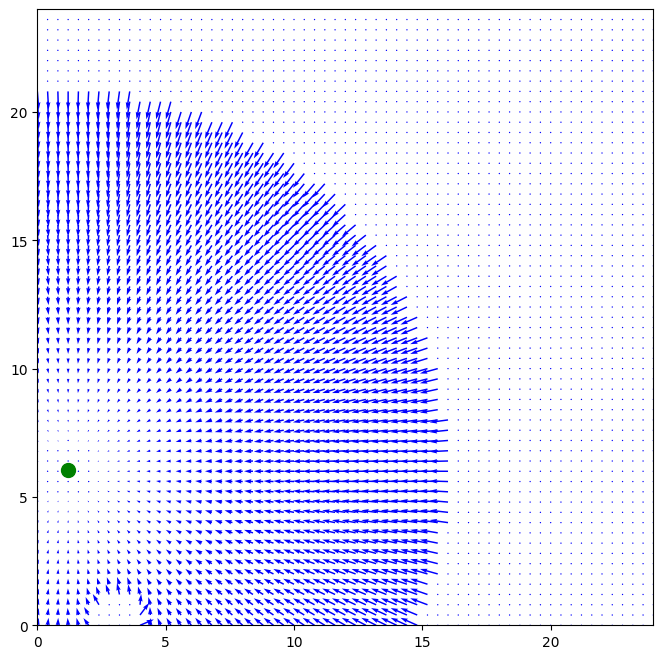

In [29]:
Ft = Fatt + Frep

# Normalização
# Ft = Ft / np.linalg.norm(Ft, axis=1).reshape((len(Ft), 1))

Ft_x = Ft[:,0]
Ft_y = Ft[:,1]

# Threshold para visualização
fmax = .15
Fm = np.linalg.norm(Ft, axis=1)
Ft_x[Fm > fmax], Ft_y[Fm > fmax] = 0, 0

# Plotando a força total
fig = plt.figure(figsize=(8, 8), dpi=100)
ax = fig.add_subplot(111, aspect='equal')
ax.quiver(XX, YY, Ft_x, Ft_y, color='b')

# Plotando o objetivo
plt.plot(goal[0], goal[1], 'og', markersize=10)

# Plotando o obstáculo
#ax.add_patch(patches.Circle((obs[0], obs[1]), obs[4], color='k'))

# Definindo os limites do gráfico
ax.set_xlim(0, WORLDX)
ax.set_ylim(0, WORLDY)

plt.show()

## Leitura do sensor

In [30]:
# Conectando-se ao CoppeliaSim
# Run a simulation in asynchronous mode:
clientID = sim.startSimulation()

if clientID != -1:
    print("Connected to remote API server")

    # Handle para o ROBÔ    
    laser_robot = sim.getObject('/Pioneer_p3dx')

    #Handle para o LASER
    laser = sim.getObject('/Pioneer_p3dx/fastHokuyo')
    print("laser handle -> ", laser)

    # Handle para as juntas das RODAS
    motorLeft = sim.getObject('/Pioneer_p3dx_leftMotor')
    motorRight = sim.getObject('/Pioneer_p3dx_rightMotor')

    # Handle utilizado como GOAL 
    goal = get_object_position(sim, '/tree')

    L = 0.381 # Distância entre as rodas
    r = 0.0975 # Raio da roda

    seguindo = False

    maxv = 1
    maxw = np.deg2rad(45)

    Ft_x = 0
    Ft_y = 0

    while True:

        laser_robot_position = get_object_position(sim, '/Pioneer_p3dx')
        print("Posição do robô: ", laser_robot_position)
        
        # Handle para os dados do LASER
        laser_range_data = "hokuyo_range_data"
        laser_angle_data = "hokuyo_angle_data"
            
        if laser_range_data is not None and laser_angle_data is not None:
            raw_range_data, raw_angle_data = readSensorData(laser_range_data, laser_angle_data) 
        #if raw_range_data is not None and raw_angle_data is not None:
         #   raw_range_data, raw_angle_data = readSensorData(clientID, laser_range_data, laser_angle_data)     

        # Ler os dados do sensor
        #raw_range_data, raw_angle_data = readSensorData(clientID, laser_range_data, laser_angle_data)
        laser_data = np.array([raw_angle_data, raw_range_data]).T
        # Plotando os dados do sensor
        #if laser_range_data is not None and laser_angle_data is not None:
        #    draw_laser_data(laser_data)

        laser_pos = get_object_position(sim, '/Pioneer_p3dx/fastHokuyo')
        laser_ori = get_object_orientation(sim, '/Pioneer_p3dx/fastHokuyo')
        print("Laser pos -> ", laser_pos)
        print("Laser ori -> ", laser_ori)

        Hlw = transformacao(laser_pos, laser_ori)
        #reshape XY para um array de 3  elementos
        #XY = np.hstack((laser_data[:, 1].reshape((len(laser_data), 1)), laser_data[:, 0].reshape((len(laser_data), 1))))
        #print("XY -> ", np.array(XY))
        #Hxyl = transformacao(np.array(XY), laser_ori)

        v = 0.4
        w = 0

        q = [laser_robot_position[0], laser_robot_position[1]]
        g = [goal[0], goal[1]]

        # Calcular a força total
        Frep = np.zeros(2)  # inicializando uma matriz para percorrer
        # percorre o laser data
        for i in range(len(laser_data)):
            ang, dist = laser_data[i]
            #print("Laser data -> ", laser_data[i])
            # Se a leitura do laser for menor que a distância máxima do sensor
            if (5 - dist) > 0.1:
                x = dist * np.cos(ang)
                y = dist * np.sin(ang)
                # Converter para o referencial global
                #Aux = np.array(Hlw@[x, y, laser_pos[2], 1])
                Aux = np.array(Hlw@[x, y, laser_robot_position[2], 1])
                obs = [Aux[0], Aux[1], 0.5]
                #Aux3 = rep_force(np.array(np.array(q), np.array(obs)))
            else:
                print("Não entrou no if")   
                Aux3 = np.zeros((1, 2))  # Matriz de zeros se a condição não for atendida
            Frep = np.array(Frep) + np.array(Aux3) # Somatório das forças repulsivas lidar pelo sensor
        Fatt = att_force(np.array([laser_robot_position[0], laser_robot_position[1]]), np.array([goal[0], goal[1]]))

        #Frep = rep_force(XY, np.array(obs))
        print("Força atração -> ", Fatt)
        print("Força repulsão -> ", Frep)
        Ft = Fatt + Frep

        #Ft = np.atleast_2d(Ft)
        print("Força total -> ", Ft)
        print("Força total x -> ", Ft[0, 0])  # Acessa o elemento na primeira linha e primeira coluna
        print("Força total y -> ", Ft[0, 1])  # Acessa o elemento na primeira linha e segunda coluna

        Ft_x = Ft[0, 0]
        Ft_y = Ft[0, 1]
        #Ft_x = Ft[:,0]
        #Ft_y = Ft[:,1]

        if((Ft_x + Ft_y) == 0):
            Ft_x = +0.1
            Ft_y = +0.1

        # Constantes 
        kv = 1
        kw = 2

        # Verificar se o robô está de costas para o objetivo
        robot_to_goal_angle = np.arctan2(goal[1] - laser_robot_position[1], goal[0] - laser_robot_position[0])
        angle_difference = (robot_to_goal_angle - laser_ori[2] + np.pi) % (2 * np.pi) - np.pi  # Diferença de ângulo entre a orientação do robô e a direção para o objetivo

        if np.abs(angle_difference) > np.pi / 2:  # Se o ângulo de diferença for maior que 90 graus
            # Girar o robô em torno de seu eixo
            v = 0
            w = np.sign(angle_difference) * maxw
        else:
            # Calcular as velocidades das rodas conforme antes
            v = (kv * ((Ft_x*(np.cos(laser_ori[2])) + Ft_y*(np.sin(laser_ori[2])))))
            w = (kw*((np.arctan2(Ft_y, Ft_x))-laser_ori[2]))
            w = (w + np.pi) % (2 * np.pi) - np.pi 

            # limit v,w to +/- max
            v = max(min(v, maxv), -maxv)
            w = max(min(w, maxw), -maxw)

        # Calcular as velocidades das rodas
        vr = (2*v + L*w) / (2*r)
        vl = (2*v - L*w) / (2*r)

        # Setando as velocidades
        sim.setJointTargetVelocity(motorLeft, 2*vl)
        sim.setJointTargetVelocity(motorRight, 2*vr)

        # se o robô estiver a certa distância do goal, parar e sair do loop
        if np.linalg.norm(np.array(laser_robot_position) - np.array(goal)) < 0.5:
            sim.setJointTargetVelocity(motorLeft, 0)
            sim.setJointTargetVelocity(motorRight, 0)
            print("Chegou ao objetivo!")
            break

        # plotar a força total
        '''fig = plt.figure(figsize=(8, 8), dpi=100)
        ax = fig.add_subplot(111, aspect='equal')
        ax.quiver(XX, YY, Ft_x, Ft_y, color='b')
        plt.plot(goal[0], goal[1], 'og', markersize=10)

        # adiciona a posição do robô
        plt.plot(laser_robot_position[0], laser_robot_position[1], 'or', markersize=10)

        ax.add_patch(patches.Circle((obs[0], obs[1]), obs[4], color='k'))
        ax.set_xlim(0, WORLDX)
        ax.set_ylim(0, WORLDY)
        plt.show()'''


else:
    print("Failed to connect to remote API server")
    print("Exiting...")

# Stop the simulation:
sim.stopSimulation()

print("Program ended")

Connected to remote API server
laser handle ->  54
Posição do robô:  [-0.01915690211972028, -0.5499812624273047, 0.13865230525817704]
Laser pos ->  [-0.017675056754362, -0.5501431606773258, 0.2886714848278722]
Laser ori ->  [0.002123147434733376, -0.00012619015984752485, 1.5375514195356603]
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou 

Laser pos ->  [0.4357466347520597, 1.9851639913081485, 0.28869085879908823]
Laser ori ->  [0.0017775472155323938, -0.00039898810376687744, 1.3908912771809885]
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entrou no if
Não entr